In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import display
import datetime
import time
import math
import warnings
warnings.filterwarnings("ignore")
import glob

In [51]:
def read_house_data(house):
    # path = '/kaggle/input/pakistan-residential-electricity-consumption/House{}.csv'.format(house)
    path = 'precon_dataset/House{}.csv'.format(house)
    df = pd.read_csv(path)
    df['Date_Time'] = df['Date_Time'].astype("datetime64[s]")
    df = df.set_index(df['Date_Time'].values)
    df.drop(['Date_Time'], axis=1, inplace=True)
    return df

df = {}
# for i in range(1,10):
#     df[i] = read_house_data(i)


# Hosue 2 and 4
df[1] = read_house_data(4)
df1_mains2 =  df[1].iloc[:,1:].sum(axis=1)
df[1].insert(loc = 1,column = 'Sum_kW',value = df1_mains2)

df[2] = read_house_data(2)
df2_mains2 =  df[2].iloc[:,1:].sum(axis=1)
df[2].insert(loc = 1,column = 'Sum_kW',value = df2_mains2)

In [52]:
for i in range(1,3):
    print('House {} data has shape: '.format(i), df[i].shape)
    display(df[i].tail(3))

House 1 data has shape:  (525600, 7)


,Usage_kW,Sum_kW,AC_DR_kW,Kitchen_kW,AC_BR_kW,AC_LR_kW,AC_MBR_kW
2019-05-31 23:57:00,4.4730,2.0375,0.0002,0.1980,1.0414,0.0102,0.7877
2019-05-31 23:58:00,4.3807,1.9472,0.0001,0.1973,0.9526,0.0101,0.7871
2019-05-31 23:59:00,4.2567,1.8295,0.0000,0.1960,0.8361,0.0100,0.7874


House 2 data has shape:  (525600, 7)


,Usage_kW,Sum_kW,AC_LR_kW,AC_DR_kW,AC_BR_kW,Kitchen_kW,UPS_kW
2019-05-31 23:57:00,2.9424,1.0753,0.0001,0.0002,0.9637,0.0005,0.1108
2019-05-31 23:58:00,2.9787,1.0938,0.0000,0.0001,0.9822,0.0005,0.1110
2019-05-31 23:59:00,2.9385,1.0663,0.0001,0.0001,0.9526,0.0005,0.1130


In [53]:
dates = {}
for i in range(1,3):
    dates[i] = [str(time)[:10] for time in df[i].index.values]
    dates[i] = sorted(list(set(dates[i])))
    print('House {0} data contain {1} days from {2} to {3}.'.format(i,len(dates[i]),dates[i][0], dates[i][-1]))
    print(dates[i], '\n')

House 1 data contain 365 days from 2018-06-01 to 2019-05-31.
['2018-06-01', '2018-06-02', '2018-06-03', '2018-06-04', '2018-06-05', '2018-06-06', '2018-06-07', '2018-06-08', '2018-06-09', '2018-06-10', '2018-06-11', '2018-06-12', '2018-06-13', '2018-06-14', '2018-06-15', '2018-06-16', '2018-06-17', '2018-06-18', '2018-06-19', '2018-06-20', '2018-06-21', '2018-06-22', '2018-06-23', '2018-06-24', '2018-06-25', '2018-06-26', '2018-06-27', '2018-06-28', '2018-06-29', '2018-06-30', '2018-07-01', '2018-07-02', '2018-07-03', '2018-07-04', '2018-07-05', '2018-07-06', '2018-07-07', '2018-07-08', '2018-07-09', '2018-07-10', '2018-07-11', '2018-07-12', '2018-07-13', '2018-07-14', '2018-07-15', '2018-07-16', '2018-07-17', '2018-07-18', '2018-07-19', '2018-07-20', '2018-07-21', '2018-07-22', '2018-07-23', '2018-07-24', '2018-07-25', '2018-07-26', '2018-07-27', '2018-07-28', '2018-07-29', '2018-07-30', '2018-07-31', '2018-08-01', '2018-08-02', '2018-08-03', '2018-08-04', '2018-08-05', '2018-08-06', 

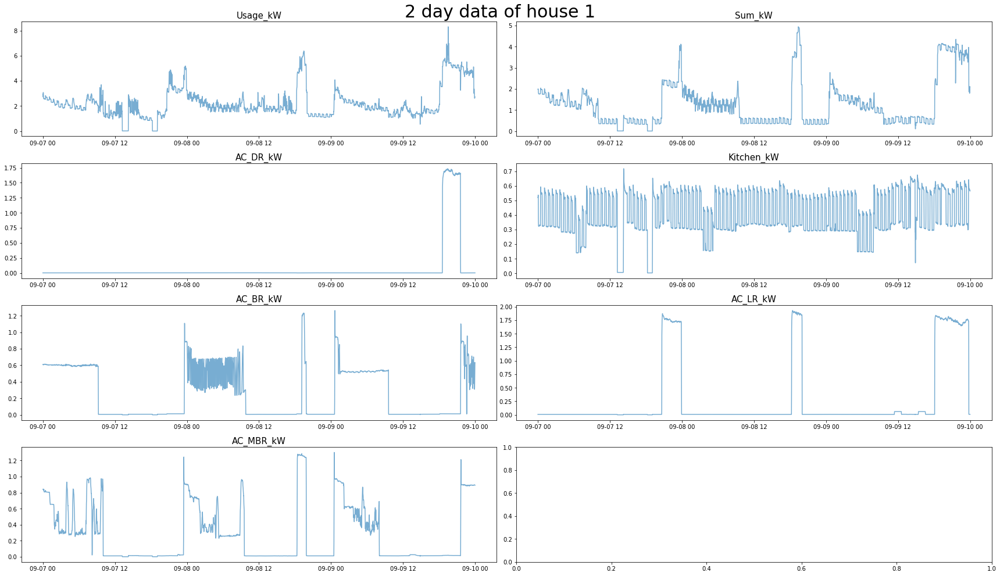

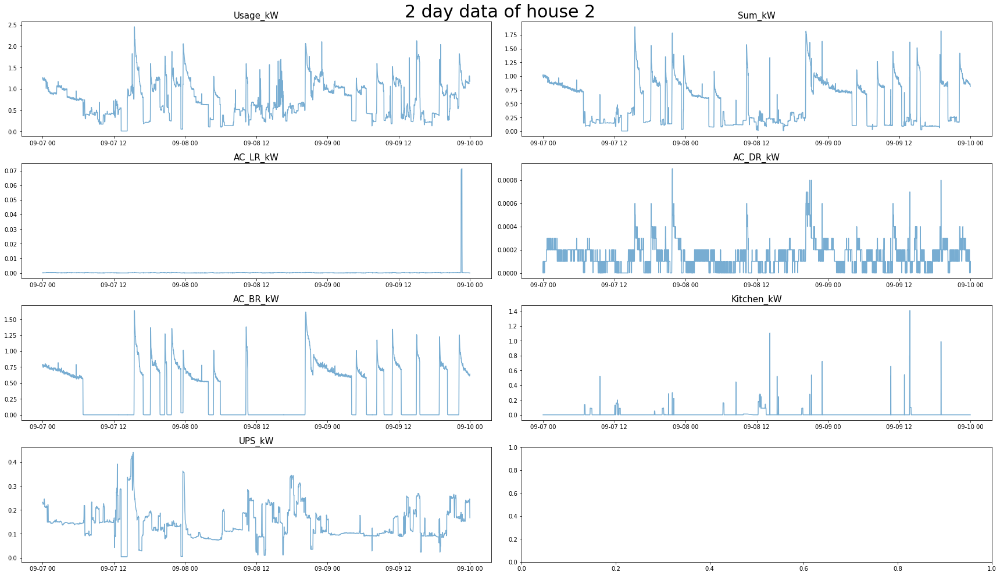

In [54]:
# Plot 2 first day data of house 1 and 2
def plot_df(df, title):
    apps = df.columns.values
    num_apps = len(apps)
    fig, axes = plt.subplots((num_apps+1)//2,2, figsize=(24, num_apps*2) )
    for i, key in enumerate(apps):
        axes.flat[i].plot(df[key], alpha = 0.6)
        axes.flat[i].set_title(key, fontsize = '15')
    plt.suptitle(title, fontsize = '30')
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)

# for i in range(1,3):
# plot_df(df[i].loc[:dates[i][1]], 'First 2 day data of house {}'.format(i))

for i in range(1,3):
    plot_df(df[i].loc[dates[i][98]:dates[i][100]], '2 day data of house {}'.format(i))

# plot_df(df[2].loc[dates[2][98]:dates[2][100]], '2 day data of house {}'.format(2))
# plot_df(df[4].loc[dates[4][98]:dates[4][100]], '2 day data of house {}'.format(4))


Text(0.5, 1.0, 'House 2')

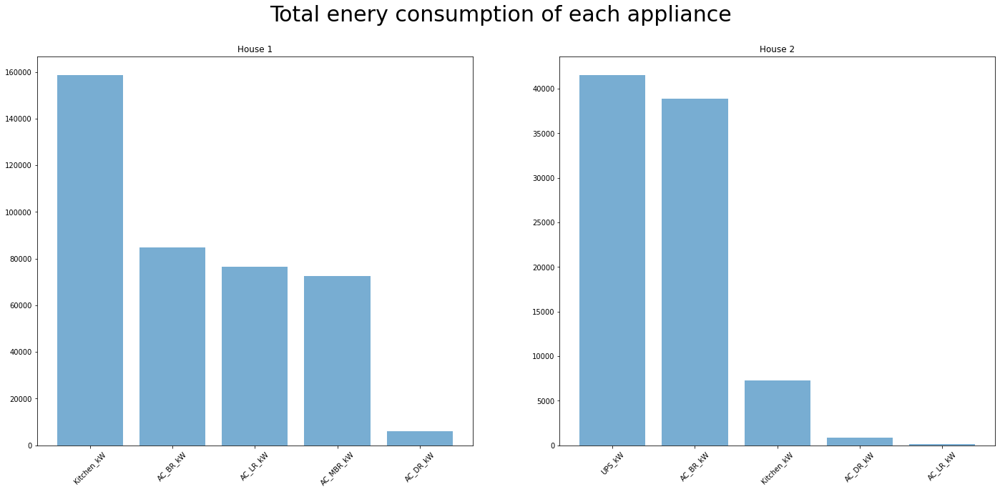

In [56]:
# Plot total energy sonsumption of each appliance from two houses
fig, axes = plt.subplots(1,2,figsize=(24, 10))
plt.suptitle('Total enery consumption of each appliance', fontsize = 30)
cons1 = df[1][df[1].columns.values[2:]].sum().sort_values(ascending=False)
app1 = cons1.index
y_pos1 = np.arange(len(app1))
axes[0].bar(y_pos1, cons1.values,  alpha=0.6)
plt.sca(axes[0])
plt.xticks(y_pos1, app1, rotation = 45)
plt.title('House 1')

cons2 = df[2][df[2].columns.values[2:]].sum().sort_values(ascending=False)
app2 = cons2.index
y_pos2 = np.arange(len(app2))
axes[1].bar(y_pos2, cons2.values, alpha=0.6)
plt.sca(axes[1])
plt.xticks(y_pos2, app2, rotation = 45)
plt.title('House 2')


In [57]:
# Separating house 1 data into train, validation and test data
df1_train = df[1].loc[:dates[1][250]]
df1_val = df[1].loc[dates[1][251]:dates[1][325]]
df1_test = df[1].loc[dates[1][326]:]
print('df_train.shape: ', df1_train.shape)
print('df_val.shape: ', df1_val.shape)
print('df_test.shape: ', df1_test.shape)

df_train.shape:  (361440, 7)
df_val.shape:  (108000, 7)
df_test.shape:  (56160, 7)


In [58]:
# # Using Usage_kW, sum_kW to predict Kitchen_kW
X_train1 = df1_train[['Usage_kW','Sum_kW']].values
y_train1 = df1_train['Kitchen_kW'].values
X_val1 = df1_val[['Usage_kW','Sum_kW']].values
y_val1 = df1_val['Kitchen_kW'].values
X_test1 = df1_test[['Usage_kW','Sum_kW']].values
y_test1 = df1_test['Kitchen_kW'].values
print(X_train1.shape, y_train1.shape, X_val1.shape, y_val1.shape, X_test1.shape, y_test1.shape)

(361440, 2) (361440,) (108000, 2) (108000,) (56160, 2) (56160,)


In [59]:
# Using decision tree regression, here we use validation data to turn the min_samples_split parameter
def mse_loss(y_predict, y):
    return np.mean(np.square(y_predict - y))
def mae_loss(y_predict, y):
    return np.mean(np.abs(y_predict - y))

min_samples_split=np.arange(2, 400, 10)
from sklearn.tree import DecisionTreeRegressor
def tree_reg(X_train, y_train, X_val, y_val, min_samples_split):
    clfs = []
    losses = []
    start = time.time()
    for split in min_samples_split:
        clf = DecisionTreeRegressor(min_samples_split = split)
        clf.fit(X_train, y_train)
        y_predict_val = clf.predict(X_val)
        clfs.append(clf)
        losses.append( mse_loss(y_predict_val, y_val) )
    print('Trainning time: ', time.time() - start)
    return clfs, losses
tree_clfs_1, tree_losses_1 = tree_reg(X_train1, y_train1, X_val1, y_val1, min_samples_split)

Trainning time:  62.97386932373047


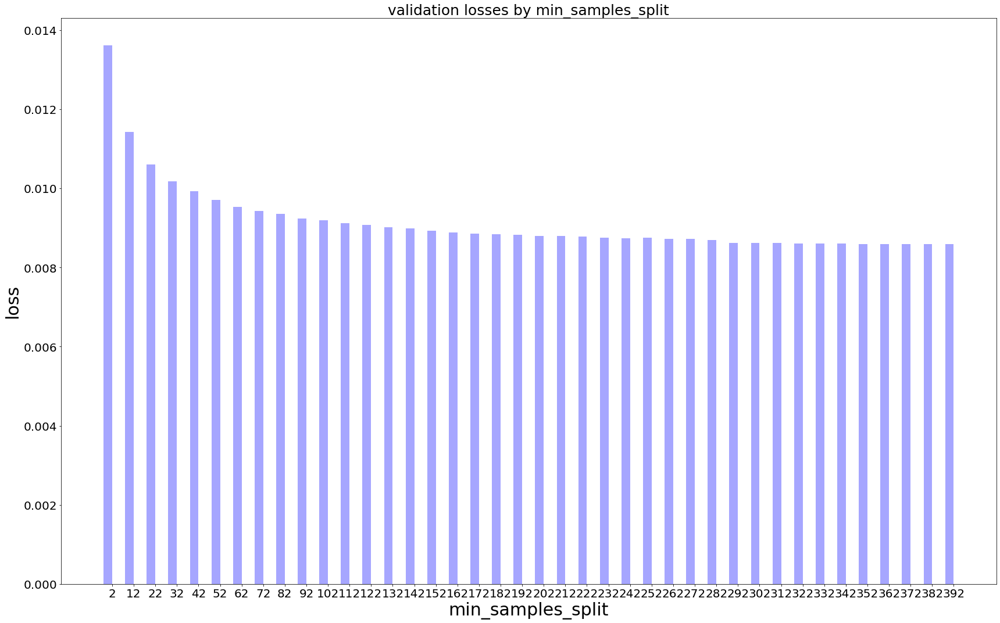

In [62]:

def plot_losses(losses, min_samples_split):
    index = np.arange(len(min_samples_split))
    bar_width = 0.4
    opacity = 0.35

    plt.bar(index, losses, bar_width, alpha=opacity, color='b')
    plt.xlabel('min_samples_split', fontsize=30)
    plt.ylabel('loss', fontsize=30)
    plt.title('validation losses by min_samples_split', fontsize = '25')
    plt.xticks(index + bar_width/2, min_samples_split, fontsize=20 )
    plt.yticks(fontsize=20 )
    plt.rcParams["figure.figsize"] = [24,15]
    plt.tight_layout()

plot_losses(tree_losses_1, min_samples_split)

In [63]:

# Choose the best model and predict AC_BR_kW consumption on the test set
ind = np.argmin(tree_losses_1)
tree_clf_1 = tree_clfs_1[ind]
y_test_predict_1 = tree_clf_1.predict(X_test1)
mse_tree_1 = mse_loss(y_test_predict_1, y_test1)
mae_tree_1 = mae_loss(y_test_predict_1, y_test1)
print('Mean square error on test set: ', mse_tree_1)
print('Mean absolute error on the test set: ', mae_tree_1)

Mean square error on test set:  0.01431044352921897
Mean absolute error on the test set:  0.08047023263609286


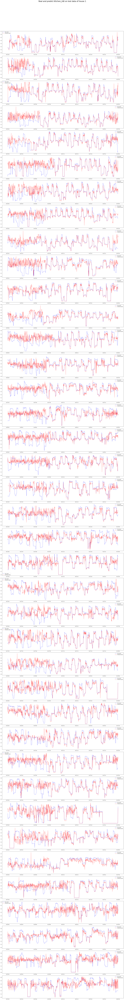

In [64]:
# Plot real and predict Kitchen_kW consumption on 65 days of test data
def plot_each_app(df, dates, predict, y_test, title, look_back = 0):
    num_date = len(dates)
    fig, axes = plt.subplots(num_date,1,figsize=(24, num_date*5) )
    plt.suptitle(title, fontsize = '25')
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)
    for i in range(num_date):
        if i == 0: l = 0
        ind = df.loc[dates[i]].index[look_back:]
        display()
        axes.flat[i].plot(ind, y_test[l:l+len(ind)], color = 'blue', alpha = 0.6, label = 'True value')
        axes.flat[i].plot(ind, predict[l:l+len(ind)], color = 'red', alpha = 0.6, label = 'Predicted value')
        axes.flat[i].legend()
        l = l+len(ind)

plot_each_app(df1_test, dates[1][326:], y_test_predict_1, y_test1, 'Real and predict Kitchen_kW on test data of house 1')

Using decision tree model we have just trained on house 1 to predict appliance consumtion on house 2

In [65]:
X_2 = df[2][['Usage_kW','Sum_kW']].values
y_2 = df[2]['Kitchen_kW'].values
print(X_2.shape, y_2.shape)

(525600, 2) (525600,)


In [92]:
y_predict_2 = tree_clf_1.predict(X_2)
mse_tree_2 = mse_loss(y_predict_2, y_2)
mae_tree_2 = mae_loss(y_predict_2, y_2)
print('Mean square error on test set: ', mse_tree_2)
print('Mean absolute error on the test set: ', mae_tree_2)

Mean square error on test set:  0.022356936824244777
Mean absolute error on the test set:  0.07793668104511303


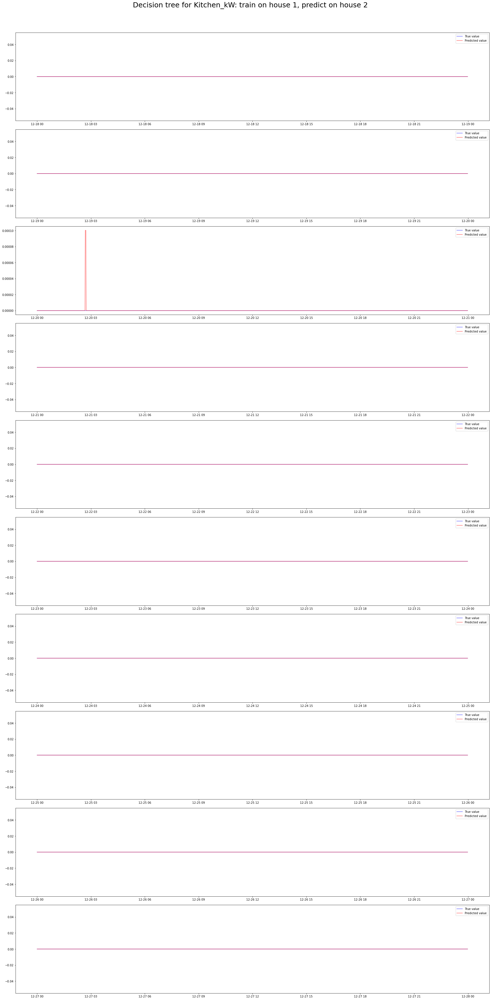

In [79]:
plot_each_app(df[2], dates[2][200:210], y_predict_2, y_2, 'Decision tree for Kitchen_kW: train on house 1, predict on house 2')

Now, decision tree method for other appliances in house 1

In [85]:
# List of other appliances in house 1:
appliances = list(df[1].columns.values[2:])
appliances.pop(1)
print(appliances)

['AC_DR_kW', 'AC_BR_kW', 'AC_LR_kW', 'AC_MBR_kW']


In [86]:
# using decision tree model on other appliances
def tree_reg_mult_apps():
    start = time.time()
    min_samples_split=np.arange(2, 400, 10)
    pred = {}
    for app in appliances:
        list_clfs = []
        losses = []
        y_train = df1_train[app].values
        y_val = df1_val[app].values
        for split in min_samples_split:
            clf = DecisionTreeRegressor(min_samples_split = split)
            clf.fit(X_train1, y_train)
            y_predict_val = clf.predict(X_val1)
            list_clfs.append(clf)
            losses.append( mse_loss(y_predict_val, y_val) )
        ind = np.argmin(losses)
        pred[app] = list_clfs[ind].predict(X_test1)
    print('Trainning time: ', time.time() - start)
    return pred

mul_pred = tree_reg_mult_apps()

Trainning time:  242.81210255622864


In [87]:
def error_mul_app(mul_pred):
    mse_losses = {}
    mae_losses = {}
    for app in appliances:
        mse_losses[app] = mse_loss(mul_pred[app], df1_test[app].values)
        mae_losses[app] = mae_loss(mul_pred[app], df1_test[app].values)
    return mse_losses, mae_losses

mul_mse_tree, mul_mae_tree = error_mul_app(mul_pred)

In [88]:
for app in appliances:
    m = np.mean(df1_test[app].values)
    print('mean of {0}: {1:.2f} - mse: {2:.2f} - mae: {3:.2f}'.format(app, m ,mul_mse_tree[app], mul_mae_tree[app]))

mean of AC_DR_kW: 0.02 - mse: 0.03 - mae: 0.02
mean of AC_BR_kW: 0.20 - mse: 0.04 - mae: 0.12
mean of AC_LR_kW: 0.03 - mse: 0.04 - mae: 0.05
mean of AC_MBR_kW: 0.22 - mse: 0.04 - mae: 0.12


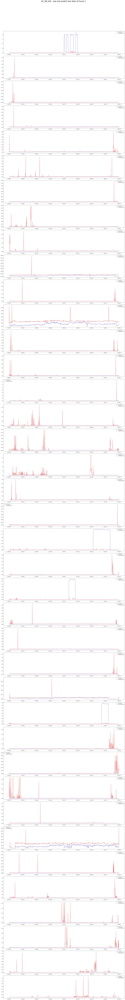

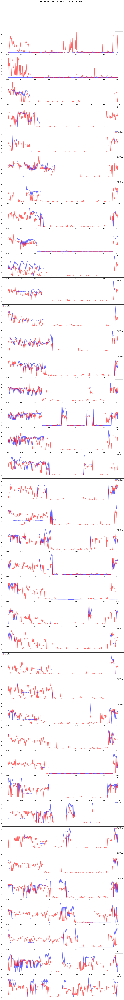

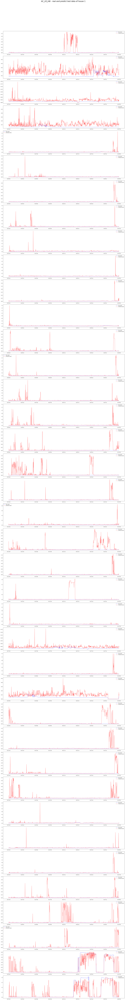

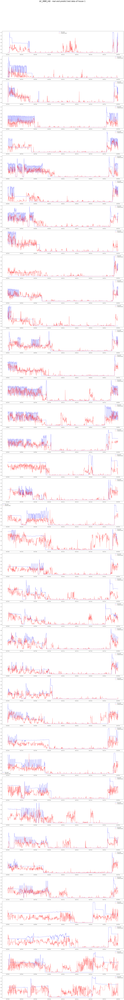

In [89]:
for app in appliances:
    plot_each_app(df1_test, dates[1][326:], mul_pred[app], df1_test[app].values,
                  '{} - real and predict test data of house 1'.format(app))